In [1]:
# Preamble 
try:
    %matplotlib inline
    %config InlineBackend.figure_format='retina'
except:
    pass

from astropy.table import Table,join,hstack,vstack
import glob
from scipy.stats import binned_statistic_2d
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import corner

In [2]:
elements = [
    'Li','C','N','O',
    'Na','Mg','Al','Si',
    'K','Ca','Sc','Ti','V','Cr','Mn',
    'Fe',
    'Co','Ni','Cu','Zn',
    'Rb','Sr','Y','Zr','Mo','Ru',
    'Ba','La','Ce','Nd','Sm','Eu'
]

In [4]:
# First read in the unvalidated GALAH DR4 file
galah_dr4_raw = Table.read('../catalogs/galah_dr4_allstar_230531.fits')
galah_dr4_raw['li_fe'] += galah_dr4_raw['fe_h'] + 1.05

In [5]:
apogee_dr17 = Table.read('../../Surveys/APOGEE_DR17/allStar-dr17-synspec_rev1.fits',1)
apogee_dr17['tmass_id'] = np.array([str(x)[2:] for x in apogee_dr17['APOGEE_ID']])
apogee_dr17['tmass_id'][0] = 'VESTA'

In [7]:
bensby_2014 = Table.read('literature_data/Bensby2014_AandA_572_71.fits')
for element in ['O','Na','Mg','Al','Si','Ca','Ti','Cr','Ni','Zn','Y','Ba']:
    bensby_2014[element+'_Fe'][bensby_2014['e_'+element+'_Fe'] == 0.0] = np.nan
bensby_2018 = Table.read('literature_data/Bensby2018_AandA_615_151.fits')
bensby_2018['Li_Fe'] = bensby_2018['A_Li']# - 1.05 - bensby_2014['Fe_H']
bensby_2018 = bensby_2018[['HIP','Li_Fe','A_Li','A_Li_u','A_Li_l','Flag']]
battistini_2015 = Table.read('literature_data/Battistini2015_AandA_577_9.fits')
for element in ['Sc','V','Mn','Co']:
    bad = battistini_2015[element+'_Fe'] == -battistini_2015['__Fe_H_']
    battistini_2015[element+'_Fe'][bad] = np.nan
battistini_2016 = Table.read('literature_data/Battistini2016_AandA_586_49.fits')
for element in ['Sr','Zr','La','Ce','Nd','Sm','Eu']:
    bad = battistini_2016[element+'_Fe'] == -battistini_2016['__Fe_H_']
    battistini_2016[element+'_Fe'][bad] = np.nan

bensby_2018 = join(bensby_2018,bensby_2014,keys='HIP')
battistini_2015 = join(battistini_2015,bensby_2014,keys='HIP')
battistini_2016 = join(battistini_2016,bensby_2014,keys='HIP')

In [8]:
nissen_2010 = Table.read('literature_data/Nissen2010_AA_511_10.fits',2)
nissen_2011 = Table.read('literature_data/Nissen2011_AA_530_15.fits',1)
nissen_2012 = Table.read('literature_data/Nissen2012_AA_543_28.fits')
nissen_2014_1 = Table.read('literature_data/Nissen2014_AA_568_25.fits',1)
nissen_2014_2 = Table.read('literature_data/Nissen2014_AA_568_25.fits',2)
nissen_2020_1 = Table.read('literature_data/Nissen2020_AA_640_81.fits',1)
nissen_2020_2 = Table.read('literature_data/Nissen2020_AA_640_81.fits',2)
nissen_2020 = hstack((nissen_2020_1,nissen_2020_2),metadata_conflicts='silent')
nissen_2020['__O_Fe_'][nissen_2020['__O_Fe_'] > 2.] = np.nan
fishlock2017 = Table.read('literature_data/Fishlock2017_MNRAS_466_4672.fits')

In [9]:
spina_bedell = Table.read('literature_data/Spina_Bedell_joined.fits')

In [10]:
def plot_feh_xfe_and_age_xfe(element, flag_sp_max = 2**14, uncertainty_limit = 0.2, kwargs = dict(s=5,alpha=0.75), minimum_nr_per_bin = 5):
    
    print(element)

    f, gs = plt.subplots(1,2,sharey=True,figsize=(9,4.5))

    ax = gs[0]
    ax.set_xlabel('[Fe/H]',fontsize=20)
    if element == 'Li':
        ax.set_ylabel('A(Li)',fontsize=20)
    else:
        ax.set_ylabel('['+element+'/Fe]',fontsize=20)

    if element != 'Fe':
        quality_cut_galah_dr4 = (
            (galah_dr4_raw['flag_sp'] < flag_sp_max) & 
            (galah_dr4_raw['flag_'+element.lower()+'_fe'] == 0) &
            (galah_dr4_raw['e_'+element.lower()+'_fe'] < uncertainty_limit)
        )
        
        print(uncertainty_limit,len(galah_dr4_raw['fe_h'][quality_cut_galah_dr4]))


        corner.hist2d(
            galah_dr4_raw['fe_h'][quality_cut_galah_dr4],
            galah_dr4_raw[element.lower()+'_fe'][quality_cut_galah_dr4],
            ax = ax,
            range = [(-2.75,0.75),(ylimits[element][0],ylimits[element][1])],
            bins = 100,
            zorder = 1
        )

#         ax.hist2d(
#             galah_dr4_raw['fe_h'][quality_cut_galah_dr4],
#             galah_dr4_raw[element.lower()+'_fe'][quality_cut_galah_dr4],
#             bins = (np.linspace(-2.75,0.75,100),np.linspace(ylimits[element][0],ylimits[element][1],100)),
#             cmin = minimum_nr_per_bin, cmap='Greys',
#             norm = LogNorm(),
#             label = 'GALAH DR4'
#         )
        
    if element in ['Li']:
        ax.scatter(
            bensby_2018['Fe_H'],
            bensby_2018['A_Li'],
            label = 'Bensby & Lind (2018)',
            zorder=2,
            c = 'C0',
            **kwargs
        )
        ax.scatter(
            nissen_2012['fe_h'],
            nissen_2012['A_Li'],
            label = 'Nissen & Schuster (2012)',
            zorder=3,
            c = 'C3',
            **kwargs
        )

    if element in ['O','Na','Mg','Al','Si','Ca','Ti','Cr','Ni','Zn','Y','Ba']:
        ax.scatter(
            bensby_2014['Fe_H'],
            bensby_2014[element+'_Fe'],
            label = 'Bensby et al. (2014)',
            zorder=2,
            c = 'C0',
            **kwargs
        )

    if element in ['Sc','V','Mn','Co']:
        ax.scatter(
            battistini_2015['Fe_H'],
            battistini_2015[element+'_Fe'],
            label = 'Battistini et al. (2015)',
            zorder=2,
            c = 'C0',
            **kwargs
        )
    if element in ['Sr','Zr','La','Ce','Nd','Sm','Eu']:
        ax.scatter(
            battistini_2016['Fe_H'],
            battistini_2016[element+'_Fe'],
            label = 'Battistini et al. (2016)',
            zorder=2,
            c = 'C0',
            **kwargs
        )

    if element in ['C']:
        ax.scatter(
            nissen_2014_1['__Fe_H_'],
            nissen_2014_1['__'+element+'_H_n'] - nissen_2014_1['__Fe_H_'],
            label = 'Nissen et al. (2014)',
            zorder=3,
            c = 'C3',
            **kwargs
        )
        ax.scatter(
            nissen_2014_2['__Fe_H_'],
            nissen_2014_2['__'+element+'_H_n'] - nissen_2014_2['__Fe_H_'],
            label = 'Nissen et al. (2014)',
            zorder=3,
            c = 'C3',
            **kwargs
        )

    if element in ['O']:
        ax.scatter(
            nissen_2014_1['__Fe_H_'],
            nissen_2014_1['__'+element+'_H_3n'] - nissen_2014_1['__Fe_H_'],
            label = 'Nissen et al. (2014)',
            zorder=3,
            c = 'C3',
            **kwargs
        )
        ax.scatter(
            nissen_2014_2['__Fe_H_'],
            nissen_2014_2['__'+element+'_H_3n'] - nissen_2014_2['__Fe_H_'],
            label = 'Nissen et al. (2014)',
            zorder=3,
            c = 'C3',
            **kwargs
        )

    if element in ['Na','Mg','Si','Ca','Ti','Cr','Ni']:
        ax.scatter(
            nissen_2010['__Fe_H_'],
            nissen_2010['__'+element+'_Fe_'],
            label = 'Nissen & Schuster (2010)',
            zorder=3,
            c = 'C3',
            **kwargs
        )

    if element in ['Mn','Cu','Zn','Y','Ba']:
        ax.scatter(
            nissen_2011['__Fe_H_'],
            nissen_2011['__'+element+'_Fe_'],
            label = 'Nissen & Schuster (2011)',
            zorder=3,
            c = 'C3',
            **kwargs
        )

    if element in ['C','O','Na','Mg','Al','Si','Ca','Ti','Cr','Ni','Sr','Y']:
        ax.scatter(
            nissen_2020['__Fe_H_'],
            nissen_2020['__'+element+'_Fe_'],
            label = 'Nissen et al. (2020)',
            zorder=4,
            c = 'C1',
            **kwargs
        )

    if element in ['Sc','Zr','La','Ce','Nd','Eu']:
        ax.scatter(
            fishlock2017['__Fe_H_'],
            fishlock2017['__'+element+'_Fe_'],
            label = 'Fishlock et al. (2017)',
            zorder=3,
            c = 'C3',
            **kwargs
        )

    ax.legend(loc='upper left')

    ax = gs[1]
    ax.set_xlabel('Age / Gyr',fontsize=20)

    if element == 'Fe':
        quality_cut_galah_dr4 = (
            (galah_dr4_raw['flag_sp'] < flag_sp_max) &
            (galah_dr4_raw['teff'] > 5250) &
            (galah_dr4_raw['logg'] > 3.) &
#             (galah_dr4_raw['logg'] < 4.5 + (galah_dr4_raw['teff']-5772)/1000) &
            (galah_dr4_raw['e_'+element.lower()+'_fe'] < 0.2)
        )
        ylabel = 'fe_h'
        
    else:
        quality_cut_galah_dr4 = (
            (galah_dr4_raw['flag_sp'] < 64) & 
            (galah_dr4_raw['teff'] > 5250) &
            (galah_dr4_raw['logg'] > 3.) &
            (galah_dr4_raw['flag_'+element.lower()+'_fe'] == 0) &
            (galah_dr4_raw['e_'+element.lower()+'_fe'] < uncertainty_limit)
        )
        ylabel = element.lower()+'_fe'
        
    yperc = np.percentile(galah_dr4_raw[ylabel][quality_cut_galah_dr4],q=[1,99])

    corner.hist2d(
        galah_dr4_raw['age'][quality_cut_galah_dr4],
        galah_dr4_raw[ylabel][quality_cut_galah_dr4],
        ax = ax,
        range = [(0,14.5),(ylimits[element][0],ylimits[element][1])],
        bins = 100,
        zorder = 1
    )
    
#     ax.hist2d(
#         galah_dr4_raw['age'][quality_cut_galah_dr4],
#         galah_dr4_raw[ylabel][quality_cut_galah_dr4],
#         bins = (np.linspace(0,14.5,100),np.linspace(ylimits[element][0],ylimits[element][1],100)),
#         cmin = minimum_nr_per_bin, cmap='Greys',
#         norm = LogNorm(),
#         label = 'GALAH DR4'
#     )
    
    if element == 'Li':
        ax.scatter(
            bensby_2018['Age'][abs(bensby_2018['b_Age'] - bensby_2018['b_age_lc']) < 4],
            bensby_2018['A_Li'][abs(bensby_2018['b_Age'] - bensby_2018['b_age_lc']) < 4],
            label = 'Bensby & Lind (2018)',
            zorder=2,
            c = 'C0',
            **kwargs
        )

    if element in ['O','Na','Mg','Al','Si','Ca','Ti','Cr','Ni','Zn','Y','Ba']:
        ax.scatter(
            bensby_2014['Age'][abs(bensby_2014['b_Age'] - bensby_2014['b_age_lc']) < 4],
            bensby_2014[element+'_Fe'][abs(bensby_2014['b_Age'] - bensby_2014['b_age_lc']) < 4],
            label = 'Bensby et al. (2014)',
            zorder=2,
            c = 'C0',
            **kwargs
        )
    if element in ['Fe']:
        ax.scatter(
            bensby_2014['Age'][abs(bensby_2014['b_Age'] - bensby_2014['b_age_lc']) < 4],
            bensby_2014['Fe_H'][abs(bensby_2014['b_Age'] - bensby_2014['b_age_lc']) < 4],
            label = 'Bensby et al. (2014)',
            zorder=2,
            c = 'C0',
            **kwargs
        )
        gs[0].set_ylabel('[Fe/H]')

    if element in ['Sc','V','Mn','Co']:
        ax.scatter(
            battistini_2015['Age'][abs(battistini_2015['b_Age'] - battistini_2015['b_age_lc']) < 4],
            battistini_2015[element+'_Fe'][abs(battistini_2015['b_Age'] - battistini_2015['b_age_lc']) < 4],
            label = 'Battistini et al. (2015)',
            zorder=2,
            c = 'C0',
            **kwargs
        )
    if element in ['Sr','Zr','La','Ce','Nd','Sm','Eu']:
        ax.scatter(
            battistini_2016['Age'][abs(battistini_2016['b_Age'] - battistini_2016['b_age_lc']) < 4],
            battistini_2016[element+'_Fe'][abs(battistini_2016['b_Age'] - battistini_2016['b_age_lc']) < 4],
            label = 'Battistini et al. (2016)',
            zorder=2,
            c = 'C0',
            **kwargs
        )
    if element in ['C','O','Na','Mg','Al','Si','Ca','Ti','Cr','Ni','Sr','Y']:
        ax.scatter(
            nissen_2020['Age'],
            nissen_2020['__'+element+'_Fe_'],
            label = 'Nissen et al. (2020)',
            zorder=4,
            c = 'C1',
            **kwargs
        )

    if element in ['C','O','Na','Mg','Al','Si','Ca','Sc','Ti','V','Cr','Mn','Co','Ni','Cu','Zn','Sr']:
        ax.scatter(
            spina_bedell['Agemp'],
            spina_bedell['__'+element+'I_H_'] - spina_bedell['__Fe_H_'],
            label = 'Bedell et al. (2018)',
            zorder=5,
            c = 'C2',
            **kwargs
        )
    
    if element in ['Sc','Ti','Cr','Y','Zr','Ba','La','Ce','Nd','Sm','Eu']:
        ax.scatter(
            spina_bedell['Agemp'],
            spina_bedell['__'+element+'II_H_'] - spina_bedell['__Fe_H_'],
            label = 'Bedell et al. (2018)',
            zorder=5,
            c = 'C2',
            **kwargs
        )

    if element in ['Fe']:
        
        ax.scatter(
            nissen_2020['Age'],
            nissen_2020['__Fe_H_'],
            label = 'Nissen et al. (2020)',
            zorder=4,
            c = 'C1',
            **kwargs
        )
        ax.scatter(
            spina_bedell['Agemp'],
            spina_bedell['__Fe_H_'],
            label = 'Bedell et al. (2018)',
            zorder=5,
            c = 'C2',
            **kwargs
        )
        gs[0].set_ylabel('[Fe/H]')

    ax.legend(loc='upper left')
    plt.tight_layout()
    plt.show()
    plt.close()

K
0.2 705272


No handles with labels found to put in legend.
No handles with labels found to put in legend.


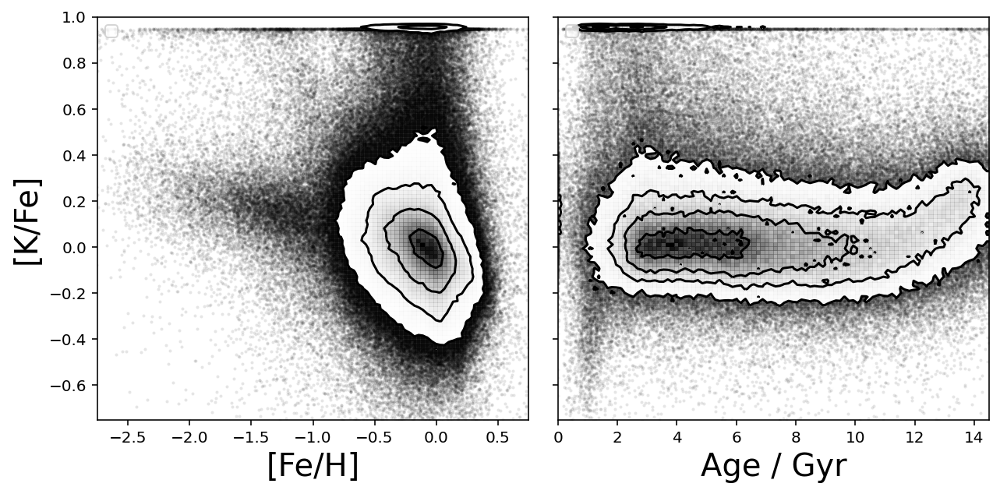

Ca
0.2 714985


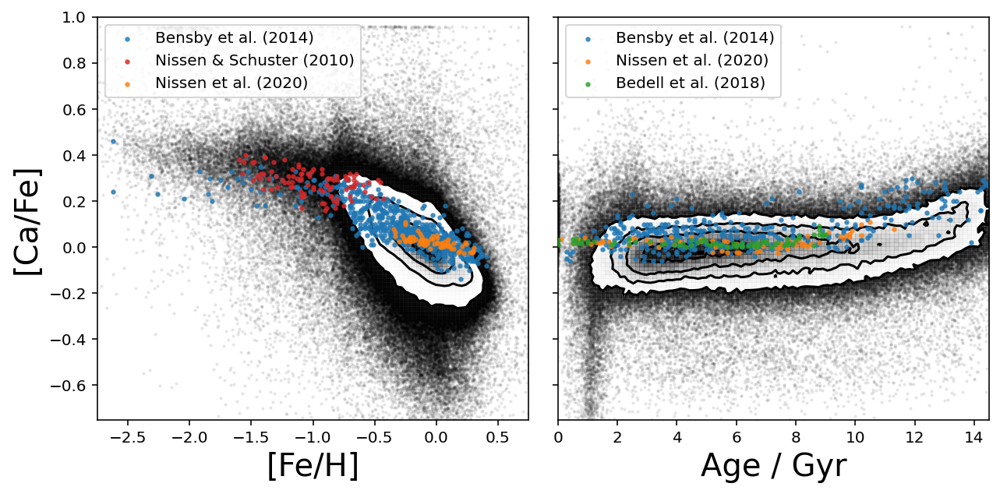

Sc
0.2 669879


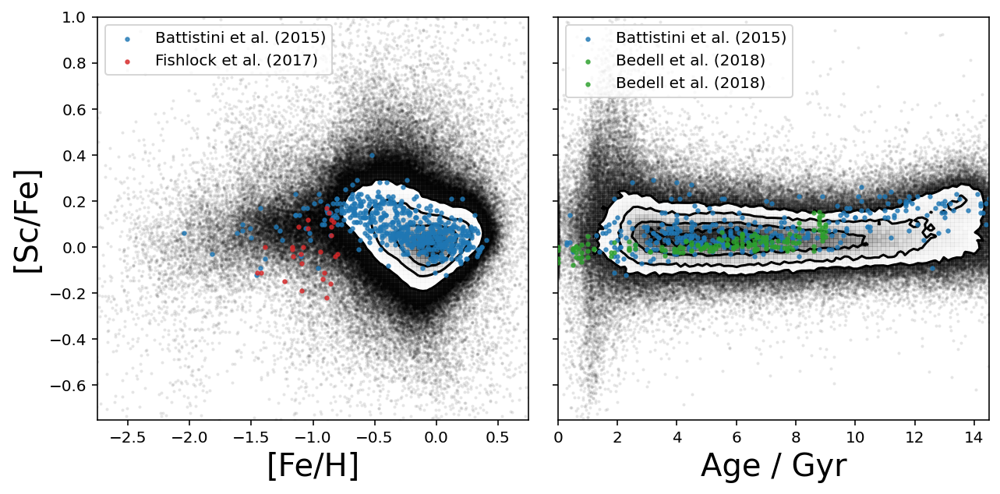

Ti
0.2 566657


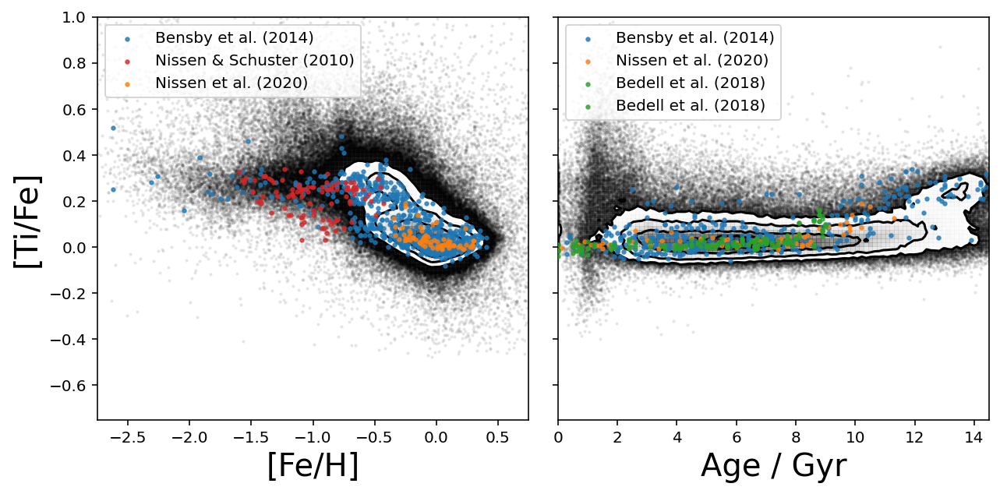

V
0.2 574132


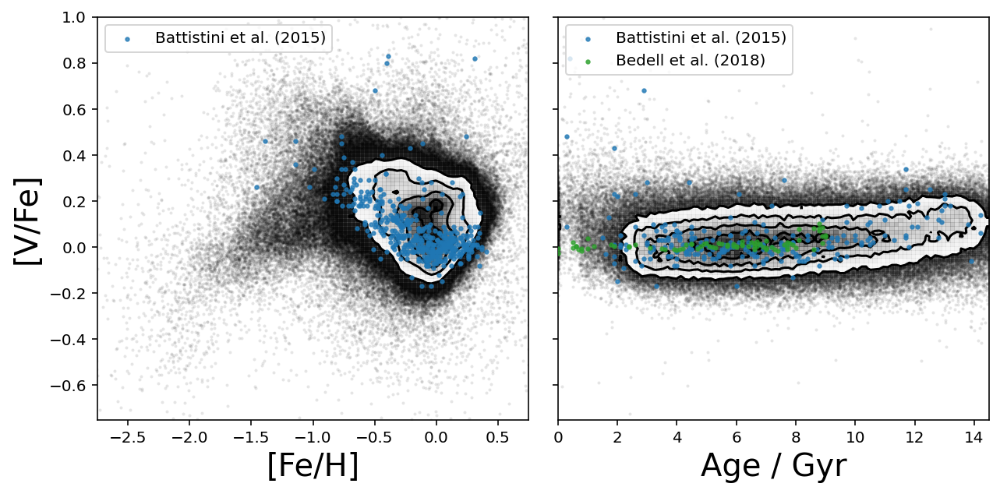

Cr
0.2 684044


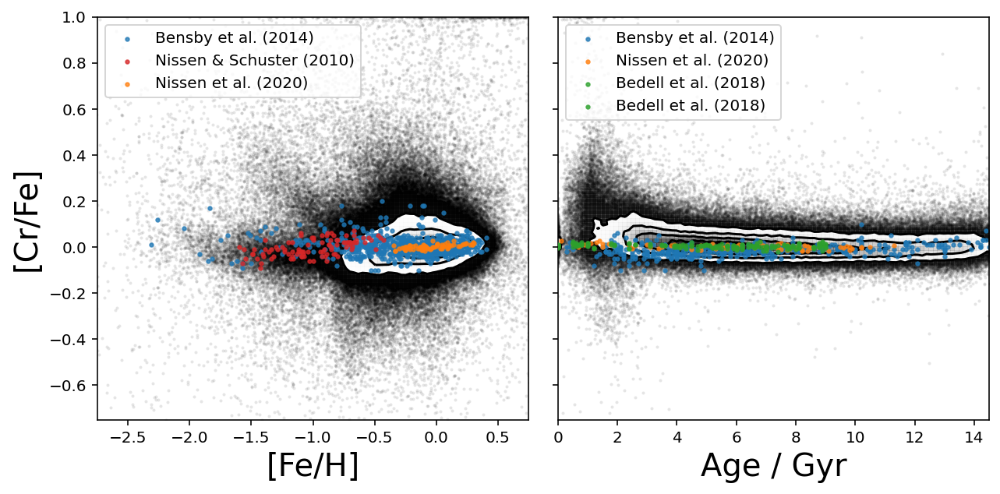

Mn
0.2 690796


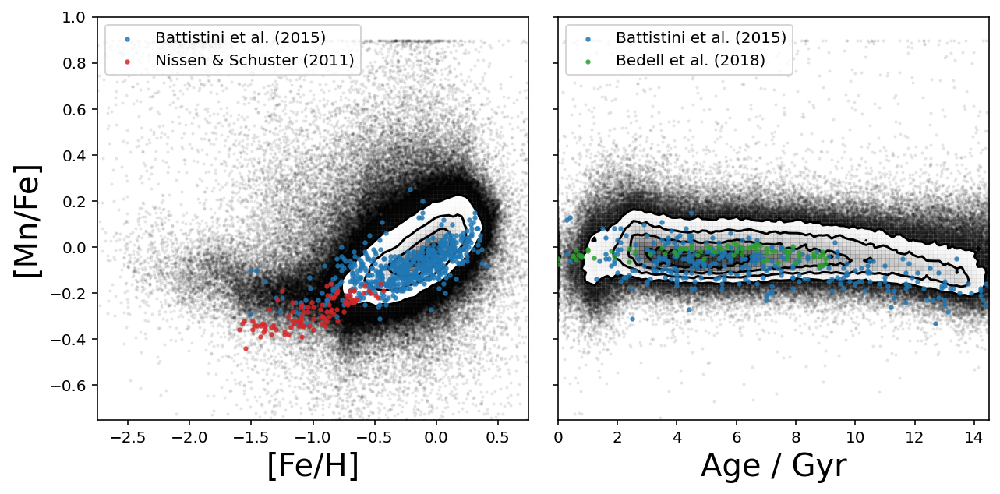

Fe


No handles with labels found to put in legend.


Co
0.2 569502


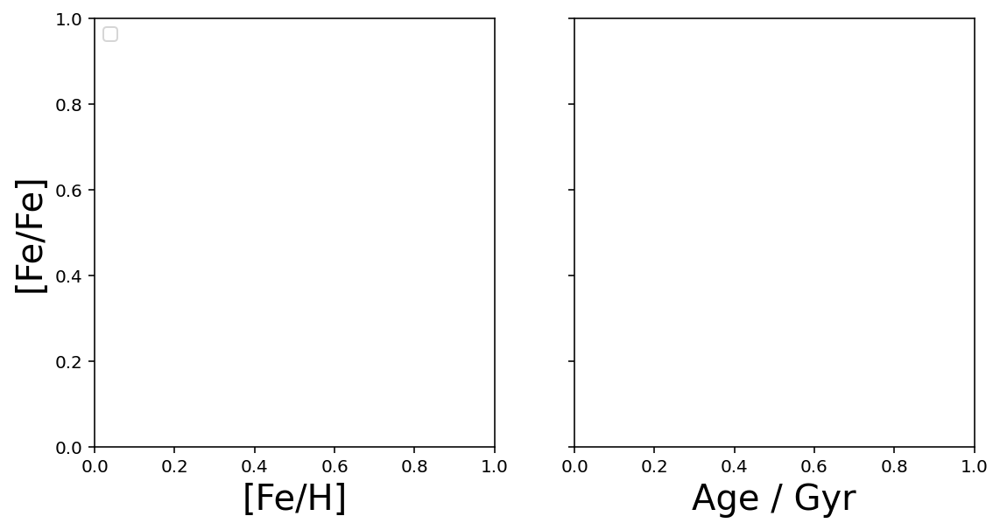

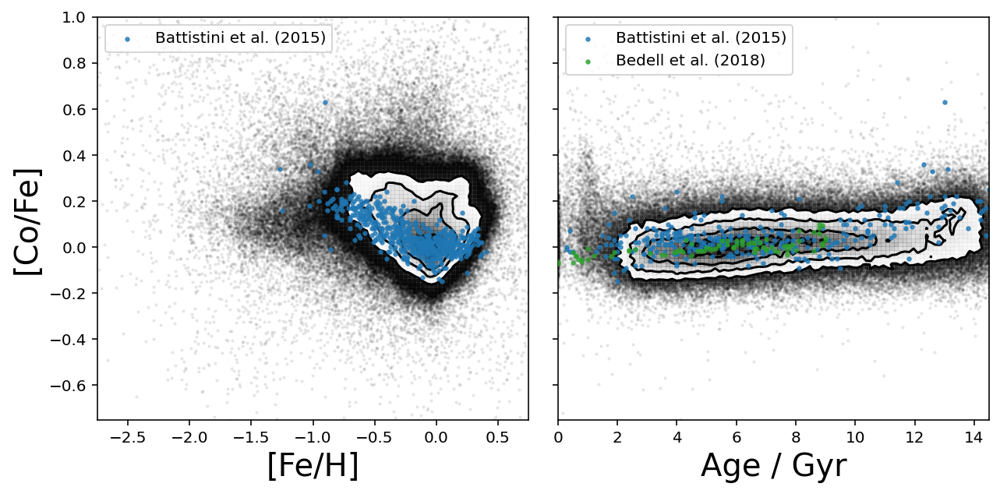

Ni
0.2 694306


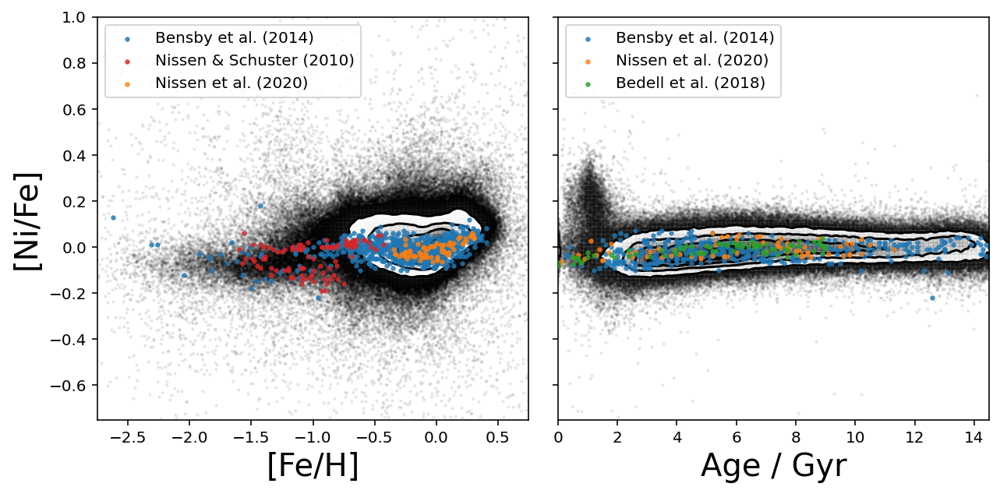

Cu
0.2 627244


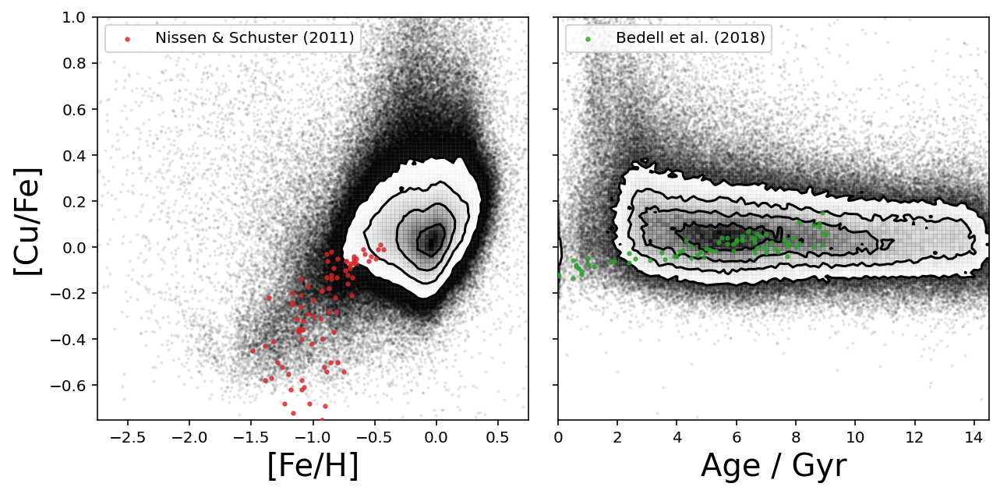

Zn
0.2 580820


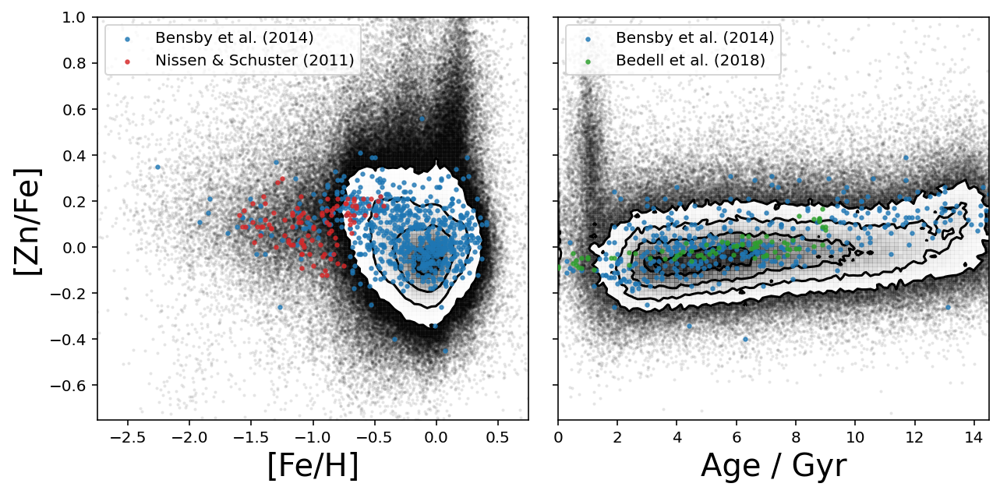

Rb
0.2 102404


No handles with labels found to put in legend.


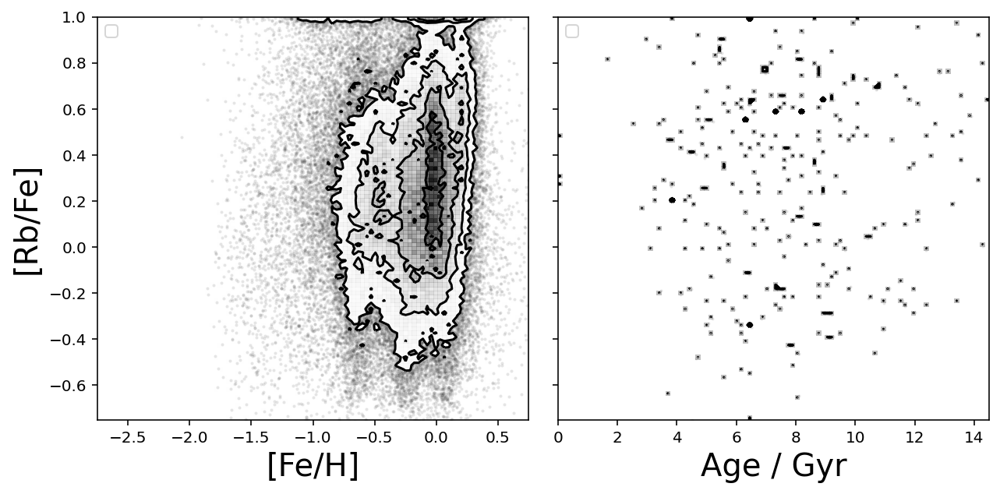

Sr
0.2 92558


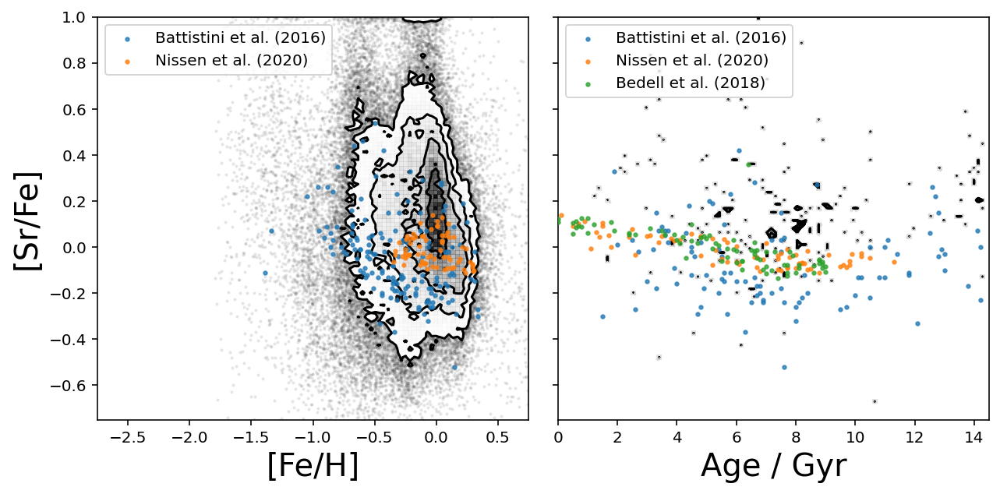

Y
0.2 526850


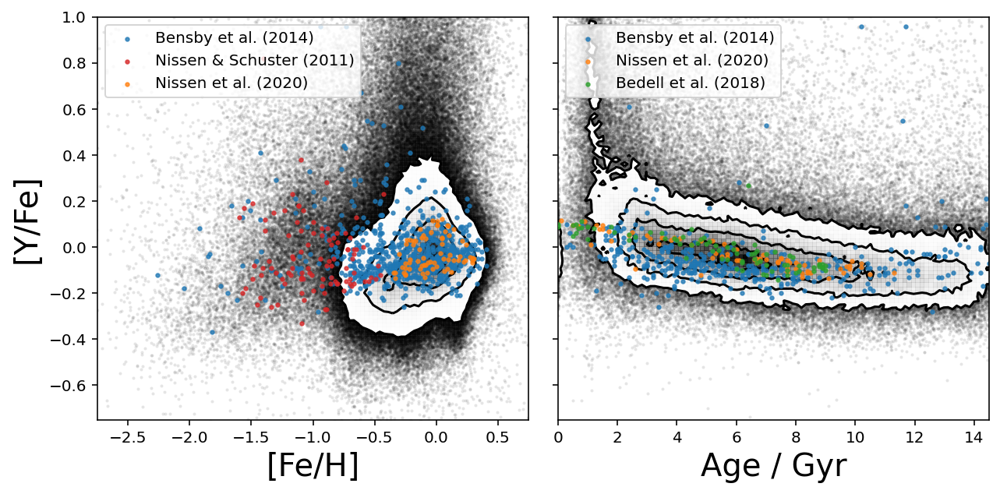

Zr
0.2 176460


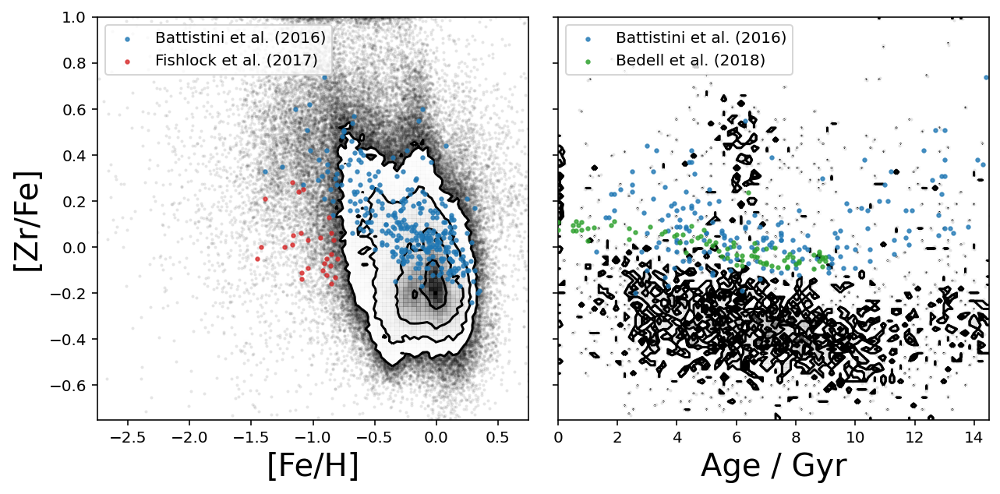

Mo
0.2 54313


Ru
0.2 43002


Ba
0.2 695870


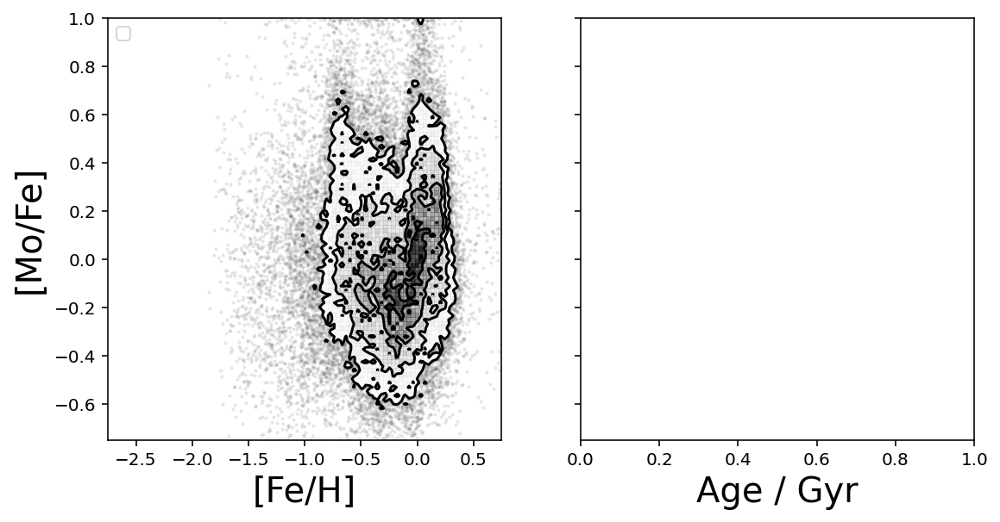

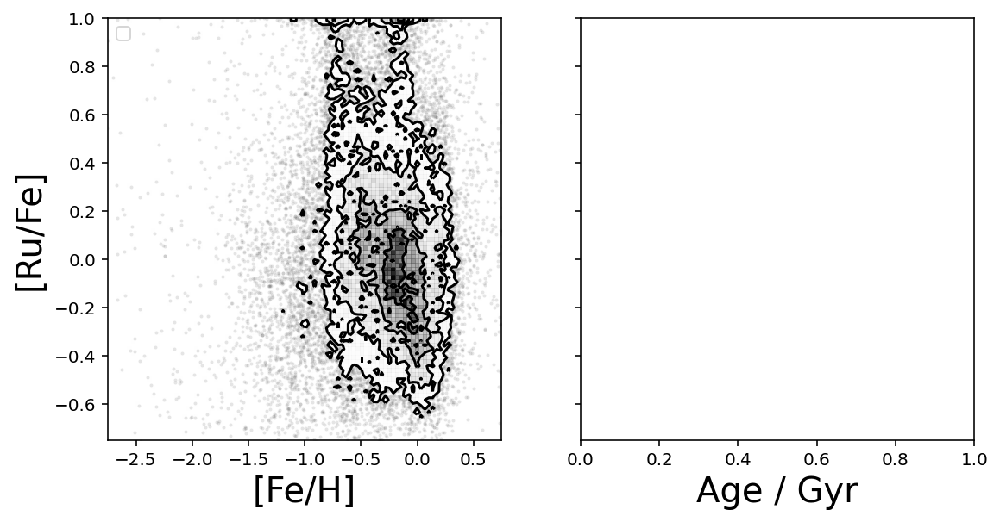

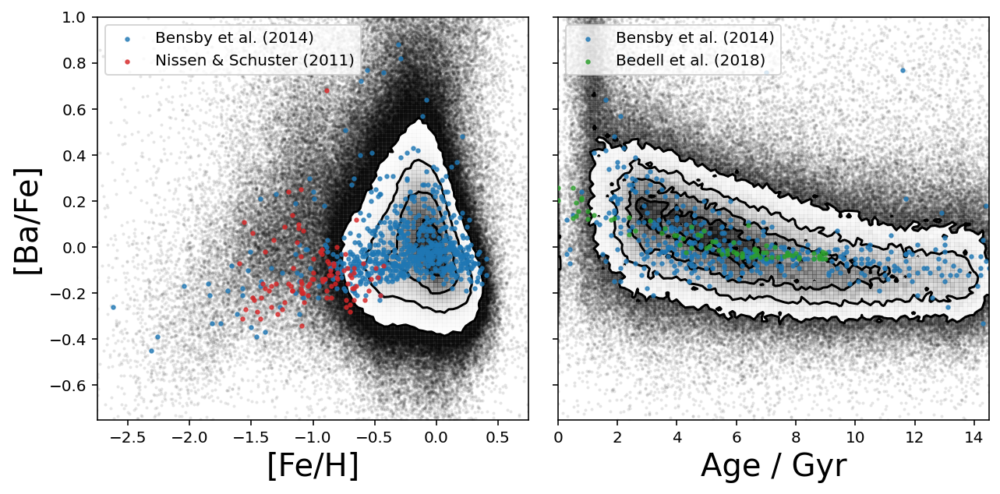

La
0.2 198969


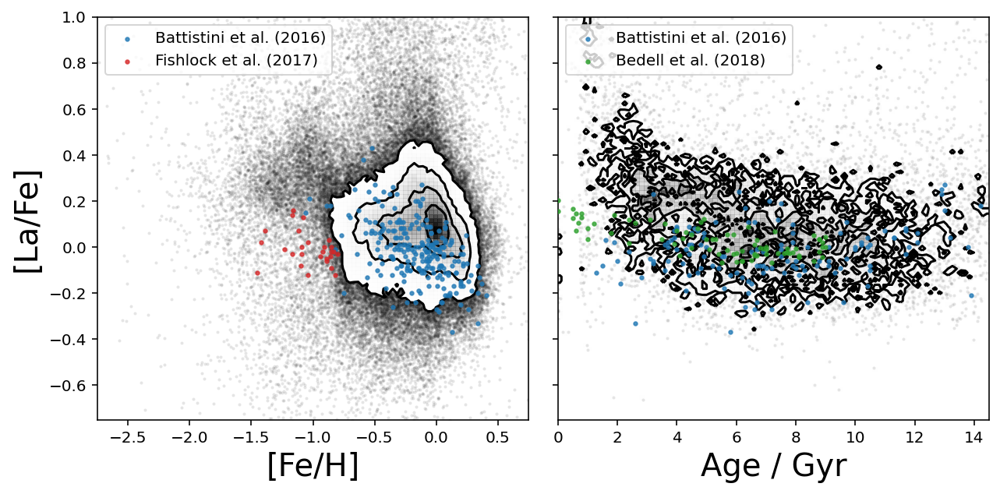

Ce
0.2 99510


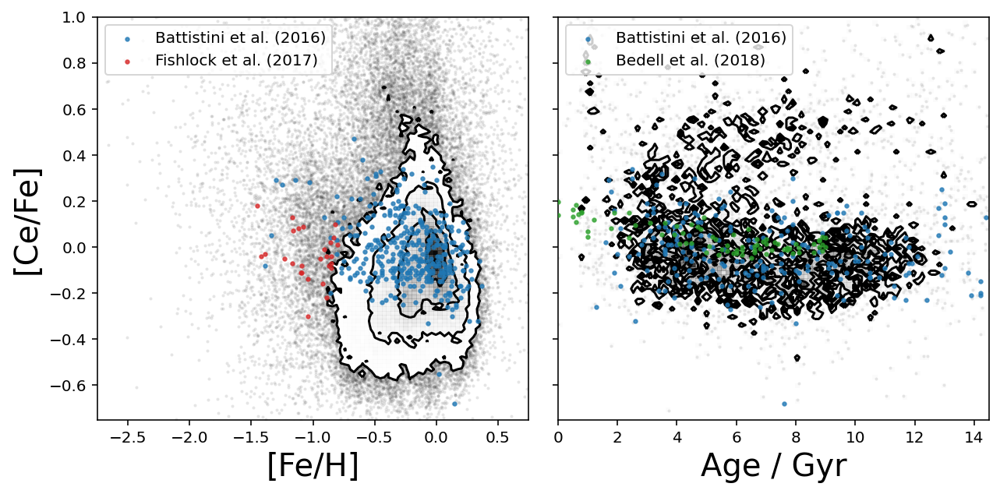

Nd
0.2 328333


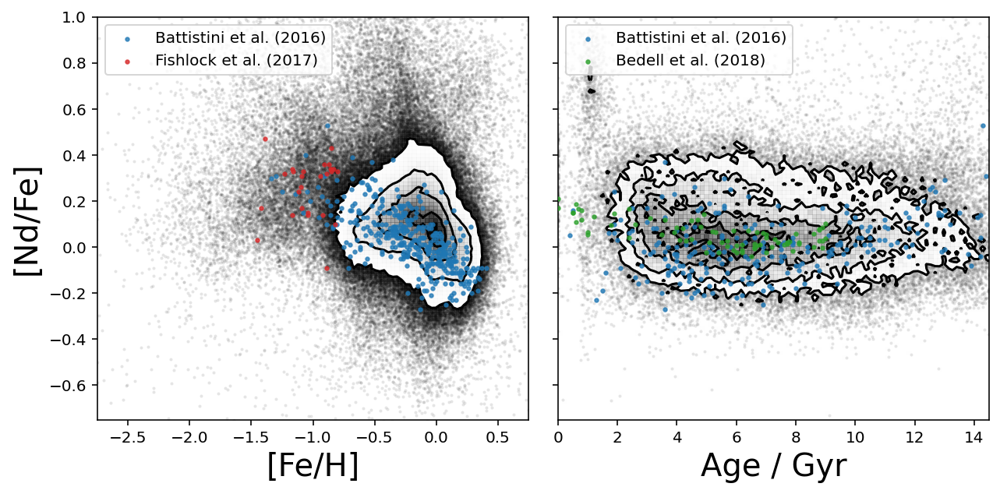

Sm
0.2 195434


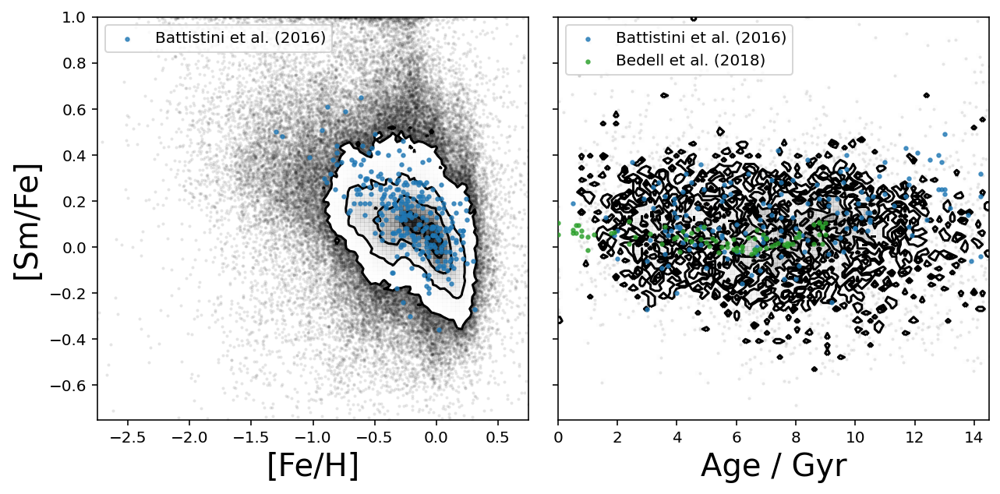

Eu
0.2 130871


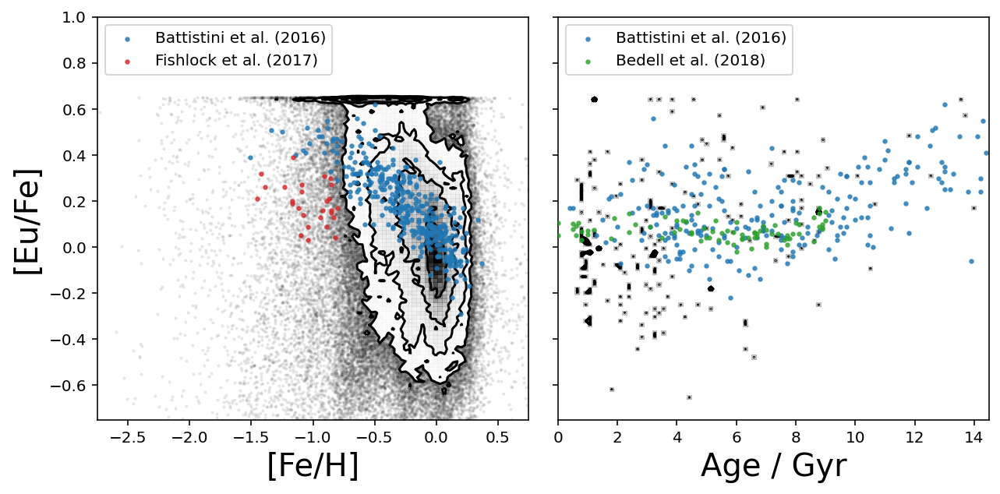

In [11]:
ylimits = dict()
ylimits['Li'] = [0.0,4.0]
for element in ['C','N','Na','Al','K','Ca']:
    ylimits[element] = [-0.75,1.]
for element in ['O']:
    ylimits[element] = [-1.0,1.5]
for element in ['Mg','Si']:
    ylimits[element] = [-0.5,1.0]

start = 8
end = 40

for element in elements[start:end]:
    
    if element not in ylimits.keys():
        ylimits[element] = [-0.75,1.]

    try:
        if element == 'Li':
            minimum_nr_per_bin = 1
        else:
            minimum_nr_per_bin = 1
        plot_feh_xfe_and_age_xfe(element, uncertainty_limit = 0.2,minimum_nr_per_bin=minimum_nr_per_bin)
    except:
        pass

In [12]:
elements = [
    'Li','C','N','O',
    'Na','Mg','Al','Si',
    'K','Ca','Sc','Ti','V','Cr','Mn',
    #'Fe',
    'Co','Ni','Cu','Zn',
    'Rb','Sr','Y','Zr','Mo','Ru',
    'Ba','La','Ce','Nd','Sm','Eu'
]

NameError: name 'bensby_all' is not defined

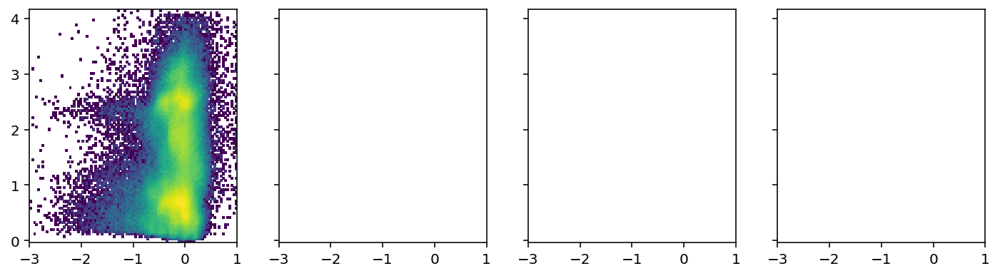

In [13]:
for element in elements:
    f, gs = plt.subplots(1,4,figsize=(12,3),sharex=True,sharey=True)
    
    ax = gs[0]
    
    useful = (
        galah_dr4_raw['flag_'+element.lower()+'_fe'] == 0
    )
    ax.hist2d(
        galah_dr4_raw['fe_h'][useful],
        galah_dr4_raw[element.lower()+'_fe'][useful],
        bins=(np.linspace(-3,1,100),100),
        norm=LogNorm(), cmin=1
    )
    
    ax = gs[1]
    
    if element.upper()+'_FE' in apogee_dr17.keys():
        useful = (
            np.isfinite(apogee_dr17[element.upper()+'_FE']) &
            (apogee_dr17[element.upper()+'_FE_FLAG'] == 0)
        )
        ax.hist2d(
            apogee_dr17['FE_H'][useful],
            apogee_dr17[element.upper()+'_FE'][useful],
            bins=(np.linspace(-3,1,100),100),
            norm=LogNorm(), cmin=1
        )
    
    ax = gs[2]
    
    if element+'_Fe' in bensby_all.keys():
        useful = (
            np.isfinite(bensby_all[element+'_Fe']) &
            (bensby_all[element+'_Fe'] != -bensby_all['Fe_H'])
        )
        ax.scatter(
            bensby_all['Fe_H'][useful],
            bensby_all[element+'_Fe'][useful]
        )